In [ ]:
import numpy as np
import pandas as pd
from scipy.integrate import odeint
from scipy.optimize import least_squares
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata
import seaborn as sns
from scipy.integrate import quad
from IPython.display import display, HTML
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import PolynomialFeatures
from scipy import stats
import statsmodels.api as sm
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
import matplotlib.patches as mpatches
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingRegressor
import plotly.express as px

### **REFERENCES**

### 🔎 **Article 1**


### 📋**A kinetic model for the direct conversion of ethanol to 1,3-butadiene**

🔗 **Link:** https://www.scientificbulletin.upb.ro/rev_docs_arhiva/full229_147200.pdf

👩🏻‍🔬🧑🏻‍🔬👨🏻‍🔬**Authors:** Alma Valentina BROSTEANU, Grigore BOZGA, Ionut BANU

**Abstract**

It is presented the development of a kinetic model for the direct
transformation of ethanol into butadiene, over a catalyst having the structure K2O:
ZrO2: ZnO / MgO-SiO2, based on experimental data published by Da Ros *et al*. (2017).
The model is developed using a reaction scheme published by the same authors,
which, in addition to the formation of butadiene, includes the formation of ethene,
butene and diethyl ether, as side products. The used rate expressions are of the
power law type, considering the reversibility of the reactions for which the chemical
equilibrium constants have low and medium values. The adequacy of the proposed
kinetic model is demonstrated by the good concordance between the calculated and
experimental values of ethanol conversion, butadiene yield and selectivity in
reaction products. It is also confirmed by the high value of the correlation
coefficient and the relatively tight statistical intervals of its parameters respectively.

### 🔎 **Article 2**

📋 **Modelling the effects of reaction temperature and flow rate on the conversion of ethanol to 1,3-butadiene**

👩🏻‍🔬🧑🏻‍🔬👨🏻‍🔬 **Authors:** S. DA ROS, M. D. JONES, D. MATTIA, M. SCHWAAB, F. B. NORONHA, J. C. PINTO

🔗 **Link:** https://doi.org/10.1016/j.apcata.2016.11.008


**Abstract**
A full factorial experimental design was performed to investigate the conversion of ethanol to 1,3-butadiene (1,3-BD), through manipulation of the reaction temperature and ethanol weight hourly space velocity. Reactions were carried out in presence of the catalyst K2O:ZrO2:ZnO/MgO-SiO2, prepared by co-precipitation methods. Mathematical models were developed to correlate observed product selectivities, 1,3-BD yields and productivities with the manipulated reaction variables, allowing for quantification of variable effects on catalyst activity and assessment of the kinetic mechanism. Obtained 1,3-BD productivities were as high as 0.5gBD/gcat h,gBD/gcat h, with 1,3-BD yields of 27%. Results suggest that acetaldehyde condensation is the rate determining step.

📍 An extensive study of the one-step ETB process was published by Da Ros *et al*. (2017), on a catalyst with the composition K2O:ZrO2:ZnO/MgO-SiO2 (particle smaller than 200 μm), using a fixed bed reactor (quartz), at temperatures (T) between 300 and 400 °C, weight space velocities (WHSV) 0.3 - 2.5 h-1 (reported to ethanol), and ethanol feed molar fractions between 0.41 and 0.85 (in presence of argon as a carrier gas).

The main results obtained by the authors are presented in Table 1.

These were calculated from experimental measurements, using the
following relations:

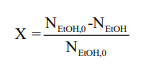

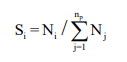

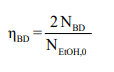

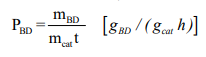

${N_j}$ : molar flow rate of the product i’ at the exit of the reactor

$\mathrm{N_{EtOH,0}}$ : molar flow rate of ethanol in the reactor feed

${m_{BD}}$ : mass of BD collected during the time interval, t

${m_{cat}}$: amount of the catalyst used in the reactor

X : ethanol conversion

${S_i}$ : selectivity of ethanol transformation into the product i’

${η_{BD}}$ : yield of ethanol transformation into BD

${P_{BD}}$ : reactor productivity in BD

In [ ]:
# Constants
R = 8.314  # Universal gas constant in J/(mol K)
ethanol_feed_fraction = 0.5  # Ethanol molar feed fraction

In [ ]:
# Experimental Data from Table 1
experimental_data = {
    'T (°C)': [325, 325, 375, 375, 350, 350, 350, 350, 300, 400, 350, 350, 325, 375, 325, 350, 375, 400],
    'WHSV (h^-1)': [0.62, 1.24, 0.62, 1.24, 0.93, 0.93, 0.93, 0.93, 0.93, 0.93, 0.31, 1.55, 0.93, 0.93, 2.49, 2.49, 2.49, 2.49],
    'X (%)': [17.0, 16.4, 25.8, 26.2, 23.6, 26.2, 32.9, 29.0, 13.4, 41.8, 43.6, 13.6, 21.7, 39.1, 6.5, 9.9, 12.3, 19.1],
    'Si_BD (%)': [65.9, 49.4, 54.5, 48.8, 51.3, 52.1, 49.6, 58.7, 55.2, 50.1, 63.4, 51.7, 48.2, 54.3, 33.3, 41.4, 43.4, 46.4],
    'Si_Ac (%)': [15.0, 37.1, 21.0, 32.7, 31.2, 30.5, 33.6, 22.2, 31.5, 22.0, 14.6, 32.4, 38.6, 25.9, 57.3, 45.5, 40.6, 33.0],
    'Si_Ethene (%)': [5.6, 4.3, 8.8, 7.4, 6.1, 5.9, 5.8, 7.0, 3.9, 11.2, 7.2, 5.9, 3.7, 7.2, 3.5, 5.1, 7.0, 9.3],
    'Si_DEE (%)': [3.3, 2.8, 2.8, 2.5, 2.9, 2.9, 2.9, 2.8, 3.0, 2.4, 2.6, 2.6, 3.5, 2.8, 2.3, 2.5, 2.2, 2.3],
    'Si_Butene (%)': [7.3, 4.2, 8.4, 5.5, 5.6, 5.7, 5.2, 6.2, 4.2, 9.1, 8.0, 4.9, 4.0, 6.4, 2.3, 3.6, 4.4, 5.7],
    'ηBD (%)': [14.8, 9.0, 28.5, 22.4, 18.1, 18.3, 19.5, 17.9, 4.9, 31.4, 26.1, 14.6, 8.2, 25.3, 5.5, 13.5, 20.0, 26.8],
    'PBD (g BD/g_cat/h)': [0.06, 0.08, 0.13, 0.20, 0.12, 0.12, 0.13, 0.12, 0.03, 0.21, 0.05, 0.16, 0.05, 0.16, 0.10, 0.25, 0.37, 0.49]
}

# Convert the data to a DataFrame
df = pd.DataFrame(experimental_data)

# Display the table with a title and caption
html_table = (
    "<h3>Table 1 - Experimental data published by Da Ros et al. (2014)</h3>"
    + df.style.set_properties(**{
        'border-color': 'black',
        'border-style': 'solid',
        'border-width': '1px'
    }).set_table_styles([{
        'selector': 'thead th',
        'props': [('border-bottom', '2px solid black')]
    }]).to_html()
    + "<caption style='caption-side:bottom; text-align:left; font-size:small;'><em>Reprinted from Applied Catalysis: A-General, vol. 530, 2017, pp. 42, with permission from Elsevier.</em></caption>"
)

# Display in Jupyter Notebook or save as HTML
from IPython.display import display, HTML
display(HTML(html_table))

# To save the table as an HTML file
with open("experimental_data_with_caption.html", "w") as file:
    file.write(html_table)

,T (°C),WHSV (h^-1),X (%),Si_BD (%),Si_Ac (%),Si_Ethene (%),Si_DEE (%),Si_Butene (%),ηBD (%),PBD (g BD/g_cat/h)
0,325,0.620000,17.000000,65.900000,15.000000,5.600000,3.300000,7.300000,14.800000,0.060000
1,325,1.240000,16.400000,49.400000,37.100000,4.300000,2.800000,4.200000,9.000000,0.080000
2,375,0.620000,25.800000,54.500000,21.000000,8.800000,2.800000,8.400000,28.500000,0.130000
3,375,1.240000,26.200000,48.800000,32.700000,7.400000,2.500000,5.500000,22.400000,0.200000
4,350,0.930000,23.600000,51.300000,31.200000,6.100000,2.900000,5.600000,18.100000,0.120000
5,350,0.930000,26.200000,52.100000,30.500000,5.900000,2.900000,5.700000,18.300000,0.120000
6,350,0.930000,32.900000,49.600000,33.600000,5.800000,2.900000,5.200000,19.500000,0.130000
7,350,0.930000,29.000000,58.700000,22.200000,7.000000,2.800000,6.200000,17.900000,0.120000
8,300,0.930000,13.400000,55.200000,31.500000,3.900000,3.000000,4.200000,4.900000,0.030000
9,400,0.930000,41.800000,50.100000,22.000000,11.200000,2.400000,9.100000,31.400000,0.210000


📍 Based on the experimental results presented in Table 1, the authors developed polynomial correlations that define the dependencies for the ethanol conversion and for the selectivity of the main reaction products, in relation to the weight hourly space velocity (WHSV) and temperature.

Such correlations, although very useful in some applications, such as global plant analyses, are less suitable in the calculation of chemical reactors. In particular, the evolutions of composition and temperature along a catalyst bed, important in the reactor design, are hardly calculable using this kind of model. However, it is worth to emphasize that in the paper of Da Ros there are published valuable experimental data that characterize rather completely the dependencies of ethanol conversion, BD yield and products selectivity in respect with the working conditions.

Therefore, these data can be further exploited to develop a classical kinetic model of the ETB process.

👉 **2: Development of a kinetic model for one stage ETB process, using the data published by Da Ros *et al*.**
   
🔎 **2.2: Development of the kinetic model**


📍 In this work, we used the experimental data published by Da Ros *et al.* (2017), to develop an empirical power law type kinetic model, for ethanol transformation into BD, over ${K_2O}$:${ZrO_2}$: ${ZnO/MgO-SiO_2}$ catalyst.

The considered reaction scheme is that proposed by the same authors and corresponds to the Toussaint- Kagan mechanism (Fig. 1).

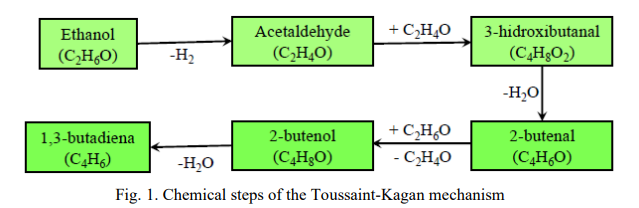

📒 **Reference:** G. Pomalaza, P. Arango Ponton, M. Capron, F. Dumeignil, Ethanol-to-butadiene: the reaction and its catalysts, Catal. Sci. Technol., vol. 10, 2020, pp.4860-4911.

🔗 **Link:** https://doi.org/10.1039/D0CY00784F

📍 To these, the authors added secondary reactions accounting for the formation of ethylene, diethyl ether and butene (Table 2).

To appreciate the degree of reversibility of the considered reactions, we calculated the associated chemical equilibrium constants, ${K_p{_,}_i}$, in the hypothesis of ideal behavior of reaction mixture. In this aim there were used the classical thermodynamic relations (Banu et al. (2021)):

📒 Reference: I. Banu, A. V. Brosteanu, G. Bumbac, G. Bozga, Ethanol Conversion to Butadiene: A Thermodynamic Analysis, Ind. Eng. Chem. Res., vol. 60, 2021, pp. 13071−13083.

🔗 Link: https://doi.org/10.1021/acs.iecr.1c02394

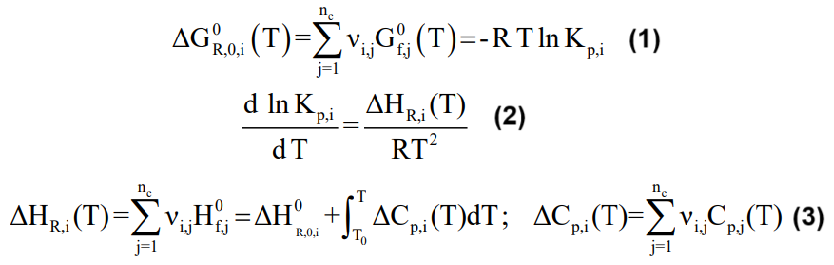

📍 In these relations:


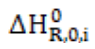

📝 enthalpy variation in reaction‚ i’ at 298 K;

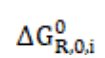

📝 standard free energy variation in the reaction‚ i’;

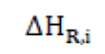

📝 enthalpy variation in reaction‚ i’ in the current conditions;

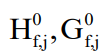

📝 standard enhalpies and standard Gibbs free energy of formation for species‚  j’;

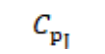

📝 molar heat capacity of‚ j’; and

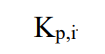

📝 equilibrium constant of reaction‚ i’, defined in respect with partial
pressures.

📍 In the equilibrium constants calculations, the authors used thermodynamic data extracted from the database of Aspen Plus v11 process simulator. Table 2 was elaborated in other to organize the equations of chemical reactions and the corresponding rate expressions.


In [ ]:
# Define the data for Table 2
data = {
    "i": [
        "R1",
        "R2",
        "R3",
        "R4",
        "R5",
        "R6",
        "R7"
    ],
    "Reaction": [
        "R1: C2H5OH ⇌ C2H4O + H2",
        "R2: 2 C2H5OH ⇌ C4H6O + H2O",
        "R3: C2H5OH ⇌ C2H4 + H2O",
        "R4: 2 C2H4 ⇌ C4H8",
        "R5: 2 C2H4O ⇌ C4H6O + H2O",
        "R6: C4H6O + C2H5OH ⇌ C4H6 + C2H4O + H2O",
        "R7: C4H10O ⇌ 2 C2H4 + H2O"
    ],
    "Rate Expression": [
        "r1 = k1 * [p_EtOH - (p_AcH * p_H2) / Kp1]",
        "r2 = k2 * [p_EtOH**2 - (p_DEE * p_H2O) / Kp1]",
        "r3 = k3 * p_EtOH",
        "r4 = k4 * p_C2H4**2",
        "r5 = k5 * [p_AcH**2 - (p_C4H6O * p_H2O) / Kp5]",
        "r6 = k6 * p_EtOH * p_C4H6O",
        "r7 = k7 * p_DEE"
    ],
    "K_m,i (kgmol/(kg*h*bar)) at 626 K": [
        "4.025e-03",
        "3.826e-04",
        "5.921e-04",
        "17.253",
        "11.312",
        "503.75",
        "5.839e-02"
    ],
    "Ei/R (in K)": [
        "7439.8",
        "6638.2",
        "1324.5",
        "3008.3",
        "4005.8",
        "1018.2",
        "13655"
    ]
}

# Create a DataFrame
table_2 = pd.DataFrame(data)

# Display the table with a title and caption
html_table = (
    "<h3>Table 2 - The equations of chemical reactions and the corresponding rate expressions</h3>"
    + table_2.style.set_properties(**{
          'border-color': 'black',
          'border-style': 'solid',
          'border-width': '1px'
      }).set_table_styles([{
          'selector': 'thead th',
          'props': [('border-bottom', '2px solid black')]
      }]).to_html()
    + "<caption style='caption-side:bottom; text-align:left; font-size:small;'><em>Subscripts in the rate expressions: EtOH - ethanol; AcH - acetaldehyde; DEE - diethyl ether; C4H6O - crotonaldehyde; m_i = 1 for i = 1, 3 and 7; m_i = 2 for i = 2, 4, 5 and 6.</em></caption>"
)

# Display in Jupyter Notebook or save as HTML
display(HTML(html_table))

# To save the table as an HTML file
with open("chemical_reactions_table.html", "w") as file:
    file.write(html_table)

,i,Reaction,Rate Expression,"K_m,i (kgmol/(kg*h*bar)) at 626 K",Ei/R (in K)
0,R1,R1: C2H5OH ⇌ C2H4O + H2,r1 = k1 * [p_EtOH - (p_AcH * p_H2) / Kp1],4.025e-03,7439.8
1,R2,R2: 2 C2H5OH ⇌ C4H6O + H2O,r2 = k2 * [p_EtOH**2 - (p_DEE * p_H2O) / Kp1],3.826e-04,6638.2
2,R3,R3: C2H5OH ⇌ C2H4 + H2O,r3 = k3 * p_EtOH,5.921e-04,1324.5
3,R4,R4: 2 C2H4 ⇌ C4H8,r4 = k4 * p_C2H4**2,17.253,3008.3
4,R5,R5: 2 C2H4O ⇌ C4H6O + H2O,r5 = k5 * [p_AcH**2 - (p_C4H6O * p_H2O) / Kp5],11.312,4005.8
5,R6,R6: C4H6O + C2H5OH ⇌ C4H6 + C2H4O + H2O,r6 = k6 * p_EtOH * p_C4H6O,503.75,1018.2
6,R7,R7: C4H10O ⇌ 2 C2H4 + H2O,r7 = k7 * p_DEE,5.839e-02,13655


In [ ]:
# Define constants
R = 8.314  # Gas constant in J/mol·K
Tm = 626   # Reference temperature in K

# Define the function to calculate k_i
def calculate_ki(Km_i, E_star, T):
    """
    Calculate the rate constant k_i using the given formula.

    Parameters:
    Km_i (float): Pre-exponential factor for reaction i (Km,i)
    E_star (float): Activation energy for reaction i (E* in J/mol)
    T (float): Temperature in K

    Returns:
    float: The rate constant k_i
    """
    # Print the formula used for k_i calculation
    formula = r"$k_i = Km,i \cdot \exp\left[\frac{E^*}{R} \left(\frac{1}{T_m} - \frac{1}{T}\right)\right]$"
    print(f"Formula used: {formula}")

    # Print the variables
    print(f"Where:")
    print(f"Km,i = {Km_i}")
    print(f"E* = {E_star}")
    print(f"T = {T}")
    print(f"R = {R}, Tm = {Tm}")

In [ ]:
# Define constants
R = 8.314  # Gas constant in J/mol·K
Tm = 626   # Reference temperature in K

# Define the function to calculate k_i
def calculate_ki(Km_i, E_star, T):
    """
    Calculate the rate constant k_i using the given formula.

    Parameters:
    Km_i (float): Pre-exponential factor for reaction i (Km,i)
    E_star (float): Activation energy for reaction i (E* in J/mol)
    T (float): Temperature in K

    Returns:
    float: The rate constant k_i
    """
    k_i = Km_i * np.exp((E_star / R) * (1 / Tm - 1 / T))
    return k_i

# Define the data for Table 3
data = {
    "i": [
        "R1", "R2", "R3", "R4", "R5", "R6", "R7"
    ],
    "Reaction": [
        "R1: C2H5OH ⇌ C2H4O + H2",
        "R2: 2 C2H5OH ⇌ C4H10O + H2O",
        "R3: C2H5OH ⇌ C2H4 + H2O",
        "R4: 2 C2H4 ⇌ C4H8",
        "R5: 2 C2H4O ⇌ C4H6O + H2O",
        "R6: C4H6O + C2H5OH ⇌ C4H6 + C2H4O + H2O",
        "R7: C4H10O ⇌ 2 C2H4 + H2O"
    ],
    "Rate Expression": [
        "r1 = k1 * [p_EtOH - (p_AcH * p_H2) / Kp1]",
        "r2 = k2 * [p_EtOH**2 - (p_DEE * p_H2O) / Kp1]",
        "r3 = k3 * p_EtOH",
        "r4 = k4 * p_C2H4**2",
        "r5 = k5 * [p_AcH**2 - (p_C4H6O * p_H2O) / Kp5]",
        "r6 = k6 * p_EtOH * p_C4H6O",
        "r7 = k7 * p_DEE"
    ],
    "Km,i (kgmol/(kg*h*bar))": [
        4.025e-03, 3.826e-04, 5.921e-04, 17.253, 11.312, 503.75, 5.839e-02
    ],
    "Ei/R (K)": [
        7439.8, 6638.2, 1324.5, 3008.3, 4005.8, 1018.2, 13655
    ]
}

# Create a DataFrame for the table
table_3 = pd.DataFrame(data)

# Define the temperature range in Celsius
T_Celsius = [300, 325, 350, 375, 400]

# Convert Celsius to Kelvin
T_Kelvin = [T + 273.15 for T in T_Celsius]

# Calculate k_i for each reaction and each temperature
results = []
for T in T_Kelvin:
    k_i_values = [
        calculate_ki(Km_i, E_star, T) for Km_i, E_star in zip(table_3['Km,i (kgmol/(kg*h*bar))'], table_3['Ei/R (K)'])
    ]
    results.append(k_i_values)

# Add the results to the DataFrame
for idx, T in enumerate(T_Kelvin):
    table_3[f'k_i at {T_Celsius[idx]} °C'] = results[idx]

# Display the table with rate constants and equations
html_table = (
    "<h3>Table 3 - The equations of chemical reactions and the corresponding rate expressions</h3>"
    + table_3.style.set_properties(**{
          'border-color': 'black',
          'border-style': 'solid',
          'border-width': '1px'
      }).set_table_styles([{
          'selector': 'thead th',
          'props': [('border-bottom', '2px solid black')]
      }]).to_html()
    + "<caption style='caption-side:bottom; text-align:left; font-size:small;'><em>Subscripts in the rate expressions: EtOH - ethanol; AcH - acetaldehyde; DEE - diethyl ether; C4H6O - crotonaldehyde; m_i = 1 for i = 1, 3, and 7; m_i = 2 for i = 2, 4, 5, and 6.</em></caption>"
)

# Save as HTML
display(HTML(html_table))

# To save the table as an HTML file
with open("chemical_reactions_table_with_k_values_for_temperatures.html", "w") as file:
    file.write(html_table)

# Print the rate constants k_i at different temperatures
print(table_3[['i', 'Reaction'] + [f'k_i at {T} °C' for T in T_Celsius]])


,i,Reaction,Rate Expression,"Km,i (kgmol/(kg*h*bar))",Ei/R (K),k_i at 300 °C,k_i at 325 °C,k_i at 350 °C,k_i at 375 °C,k_i at 400 °C
0,R1,R1: C2H5OH ⇌ C2H4O + H2,r1 = k1 * [p_EtOH - (p_AcH * p_H2) / Kp1],0.004025,7439.800000,0.003528,0.003766,0.003999,0.004227,0.004449
1,R2,R2: 2 C2H5OH ⇌ C4H10O + H2O,r2 = k2 * [p_EtOH**2 - (p_DEE * p_H2O) / Kp1],0.000383,6638.200000,0.000340,0.000361,0.000380,0.000400,0.000418
2,R3,R3: C2H5OH ⇌ C2H4 + H2O,r3 = k3 * p_EtOH,0.000592,1324.500000,0.000578,0.000585,0.000591,0.000597,0.000603
3,R4,R4: 2 C2H4 ⇌ C4H8,r4 = k4 * p_C2H4**2,17.253000,3008.300000,16.357520,16.794873,17.207451,17.597188,17.965841
4,R5,R5: 2 C2H4O ⇌ C4H6O + H2O,r5 = k5 * [p_AcH**2 - (p_C4H6O * p_H2O) / Kp5],11.312000,4005.800000,10.537001,10.913800,11.272250,11.613486,11.938575
5,R6,R6: C4H6O + C2H5OH ⇌ C4H6 + C2H4O + H2O,r6 = k6 * p_EtOH * p_C4H6O,503.750000,1018.200000,494.744058,499.182249,503.299472,507.129205,510.700445
6,R7,R7: C4H10O ⇌ 2 C2H4 + H2O,r7 = k7 * p_DEE,0.058390,13655.000000,0.045843,0.051676,0.057694,0.063867,0.070170


    i                                 Reaction  k_i at 300 °C  k_i at 325 °C  \
0  R1                  R1: C2H5OH ⇌ C2H4O + H2       0.003528       0.003766   
1  R2              R2: 2 C2H5OH ⇌ C4H10O + H2O       0.000340       0.000361   
2  R3                  R3: C2H5OH ⇌ C2H4 + H2O       0.000578       0.000585   
3  R4                        R4: 2 C2H4 ⇌ C4H8      16.357520      16.794873   
4  R5                R5: 2 C2H4O ⇌ C4H6O + H2O      10.537001      10.913800   
5  R6  R6: C4H6O + C2H5OH ⇌ C4H6 + C2H4O + H2O     494.744058     499.182249   
6  R7                R7: C4H10O ⇌ 2 C2H4 + H2O       0.045843       0.051676   

   k_i at 350 °C  k_i at 375 °C  k_i at 400 °C  
0       0.003999       0.004227       0.004449  
1       0.000380       0.000400       0.000418  
2       0.000591       0.000597       0.000603  
3      17.207451      17.597188      17.965841  
4      11.272250      11.613486      11.938575  
5     503.299472     507.129205     510.700445  
6       0.057694

   Reaction  T (°C)             Kp  ΔG (kJ/mol)  ΔH (kJ/mol)  ΔS (J/(mol·K))
0        R1     300  178994.061783   -57.635234          NaN             NaN
1        R1     325  218934.958240   -61.150878    20.576771      136.634038
2        R1     350  252958.615881   -64.455095    17.141673      130.942419
3        R1     375  285502.949710   -67.693131    14.682923      127.094119
4        R1     400  312130.214015   -70.803179          NaN             NaN
5        R2     300  251479.292069   -59.255430          NaN             NaN
6        R2     325  251479.292069   -61.840069    -6.268135       92.906352
7        R2     350  226331.351576   -63.878849    -8.948380       88.149672
8        R2     375  218934.958240   -66.262546    -4.721641       94.948553
9        R2     400  211538.508473   -68.626039          NaN             NaN
10       R3     300  505917.175332   -62.586342          NaN             NaN
11       R3     325  536982.241780   -65.612623     6.268130      120.171786

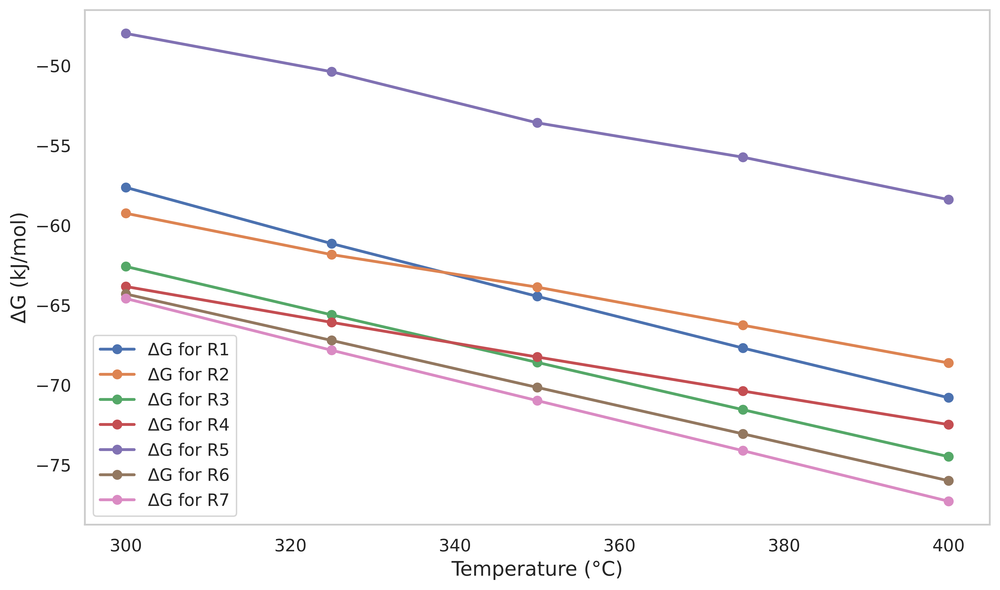

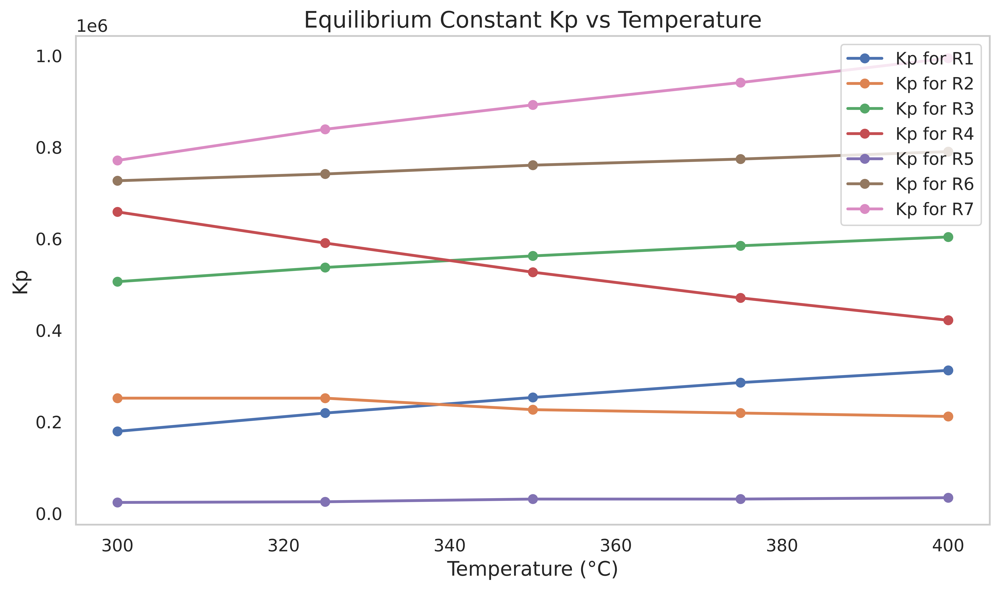

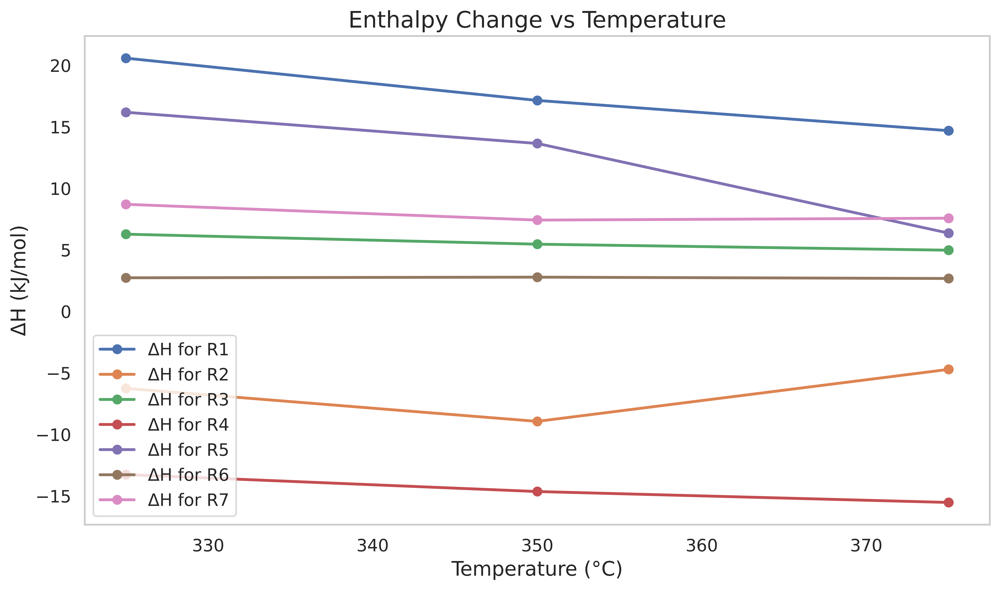

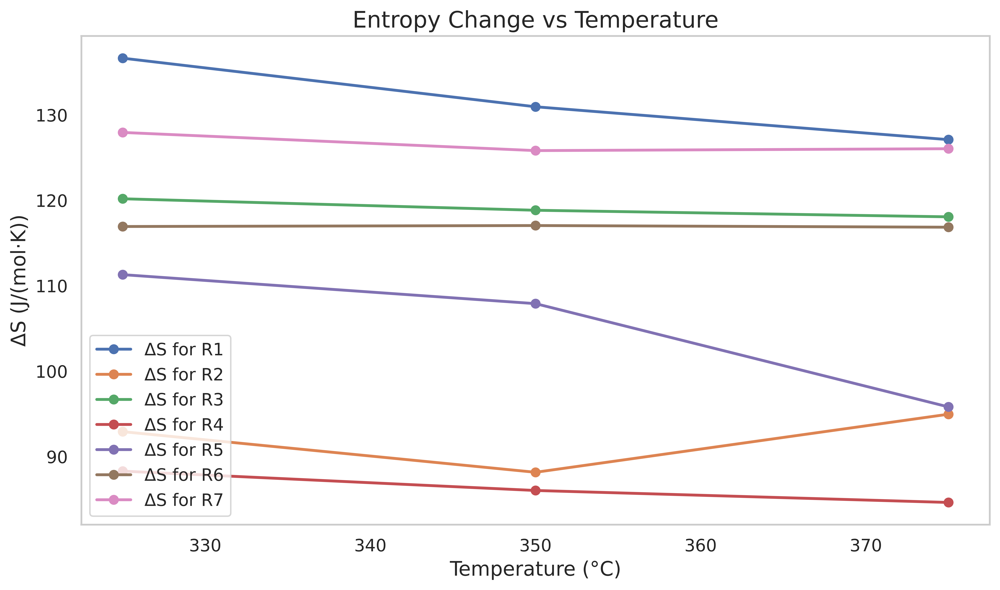

In [ ]:
# -------------------------------------------------------------------
# GLOBAL HIGH-RES SETTINGS
# -------------------------------------------------------------------
plt.rcParams.update({
    "figure.dpi": 800,           # High resolution
    "savefig.dpi": 800,          # High resolution for saving
    "font.size": 14,             # Academic-friendly font size
    "axes.titlesize": 16,
    "axes.labelsize": 14,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "legend.fontsize": 12,
    "lines.linewidth": 2         # Thicker lines for clarity
})

# -------------------------------------------------------------------
# CONSTANTS
# -------------------------------------------------------------------
R = 8.314  # Universal gas constant in J/(mol·K)

temperature_data = np.array([300, 325, 350, 375, 400])
temperature_data_K = temperature_data + 273.15

Kp_values = {
    'R1': [178994.06178317047, 218934.95824013915,
           252958.61588110132, 285502.94971045334,
           312130.21401509916],
    'R2': [251479.29206949138, 251479.29206949138,
           226331.3515764555, 218934.95824013915,
           211538.50847338935],
    'R3': [505917.1753317689, 536982.2417799445,
           562130.1822729803, 584319.5315732296,
           603550.2896806923],
    'R4': [658284.029240727, 590236.7139588027,
           526627.2572508416, 470414.1938791969,
           421597.6367047353],
    'R5': [23668.616681426014, 25147.884062602534,
           31065.066448175705, 31065.066448175705,
           34023.71407139562],
    'R6': [726331.3727378679, 741124.2722713673,
           760355.0585940466, 773668.6061007195,
           789940.8576610456],
    'R7': [770710.0713383663, 838757.4148355073,
           892011.8587991487, 940828.401866002,
           994082.8599372519]
}

# -------------------------------------------------------------------
# COMPUTE ΔG
# -------------------------------------------------------------------
results = []

for reaction in Kp_values.keys():
    for i in range(len(temperature_data)):
        T = temperature_data_K[i]
        kp = Kp_values[reaction][i]
        delta_G = -R * T * np.log(kp) / 1000  # kJ/mol

        results.append({
            'Reaction': reaction,
            'T (°C)': temperature_data[i],
            'Kp': kp,
            'ΔG (kJ/mol)': delta_G,
        })

results = pd.DataFrame(results)

# Fill NaN
numeric_columns = results.select_dtypes(include=[np.number]).columns
results[numeric_columns] = results[numeric_columns].fillna(results[numeric_columns].mean())

# -------------------------------------------------------------------
# COMPUTE ΔH and ΔS
# -------------------------------------------------------------------
for reaction in Kp_values.keys():
    for i in range(1, len(temperature_data) - 1):
        T_mid = (temperature_data_K[i - 1] + temperature_data_K[i + 1]) / 2
        dlnKp_dT = (np.log(Kp_values[reaction][i + 1]) -
                     np.log(Kp_values[reaction][i - 1])) / \
                    (temperature_data_K[i + 1] - temperature_data_K[i - 1])

        delta_H = R * T_mid**2 * dlnKp_dT / 1000  # kJ/mol

        delta_G_row = results[(results['Reaction'] == reaction) &
                              (results['T (°C)'] == temperature_data[i])]

        if not delta_G_row.empty:
            delta_G_value = delta_G_row['ΔG (kJ/mol)'].values[0]
            delta_S = ((delta_H * 1000 - delta_G_value * 1000)) / T_mid

            results.loc[(results['Reaction'] == reaction) &
                        (results['T (°C)'] == temperature_data[i]),
                        'ΔH (kJ/mol)'] = delta_H

            results.loc[(results['Reaction'] == reaction) &
                        (results['T (°C)'] == temperature_data[i]),
                        'ΔS (J/(mol·K))'] = delta_S

results[numeric_columns] = results[numeric_columns].fillna(results[numeric_columns].mean())

print(results)

# -------------------------------------------------------------------
# HIGH-RESOLUTION PLOTS (800 DPI)
# -------------------------------------------------------------------

# ΔG vs T
plt.figure(figsize=(10, 6))
for reaction in Kp_values.keys():
    plt.plot(results[results['Reaction'] == reaction]['T (°C)'],
             results[results['Reaction'] == reaction]['ΔG (kJ/mol)'],
             marker='o', label=f'ΔG for {reaction}')
plt.xlabel('Temperature (°C)')
plt.ylabel('ΔG (kJ/mol)')
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

# Kp vs T
plt.figure(figsize=(10, 6))
for reaction in Kp_values.keys():
    plt.plot(temperature_data, Kp_values[reaction], marker='o', label=f'Kp for {reaction}')
plt.title('Equilibrium Constant Kp vs Temperature')
plt.xlabel('Temperature (°C)')
plt.ylabel('Kp')
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

# ΔH vs T
plt.figure(figsize=(10, 6))
for reaction in Kp_values.keys():
    plt.plot(results[results['Reaction'] == reaction]['T (°C)'],
             results[results['Reaction'] == reaction]['ΔH (kJ/mol)'],
             marker='o', label=f'ΔH for {reaction}')
plt.title('Enthalpy Change vs Temperature')
plt.xlabel('Temperature (°C)')
plt.ylabel('ΔH (kJ/mol)')
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

# ΔS vs T
plt.figure(figsize=(10, 6))
for reaction in Kp_values.keys():
    plt.plot(results[results['Reaction'] == reaction]['T (°C)'],
             results[results['Reaction'] == reaction]['ΔS (J/(mol·K))'],
             marker='o', label=f'ΔS for {reaction}')
plt.title('Entropy Change vs Temperature')
plt.xlabel('Temperature (°C)')
plt.ylabel('ΔS (J/(mol·K))')
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()


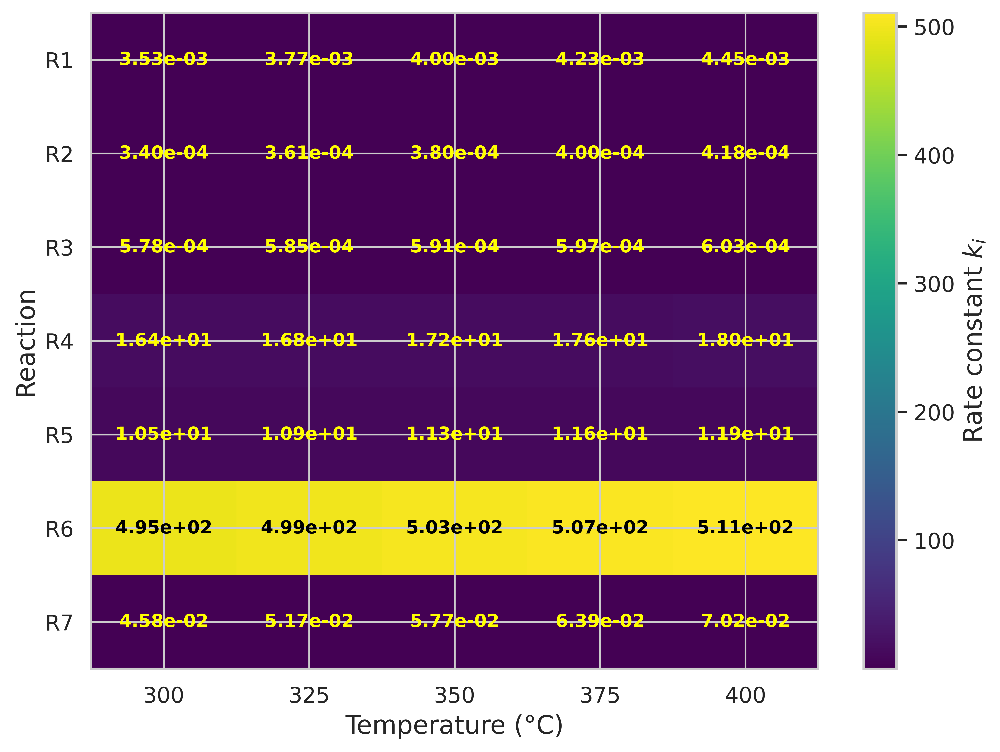

In [ ]:
# -------------------------------------------------------------
# HIGH-RESOLUTION HEATMAP OF RATE CONSTANTS kᵢ (PUBLICATION-READY)
# -------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

# Global academic plotting style
plt.rcParams.update({
    "figure.dpi": 800,
    "savefig.dpi": 800,
    "font.size": 14,
    "axes.titlesize": 16,
    "axes.labelsize": 14,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
})

# Extract k-values matrix
k_values = table_3[[f'k_i at {T} °C' for T in T_Celsius]].values
reaction_labels = table_3["i"].values
temp_labels = T_Celsius

# Heatmap figure
fig, ax = plt.subplots(figsize=(8, 6), dpi=800)

# Heatmap creation
cmap = plt.get_cmap("viridis")
im = ax.imshow(k_values, cmap=cmap, aspect="auto")

# Title and labels
ax.set_xlabel("Temperature (°C)")
ax.set_ylabel("Reaction")

# Tick labels
ax.set_xticks(np.arange(len(temp_labels)))
ax.set_xticklabels(temp_labels)
ax.set_yticks(np.arange(len(reaction_labels)))
ax.set_yticklabels(reaction_labels)

# Automatic threshold for switching text color
threshold = k_values.max() * 0.55

# Annotate each cell
for i in range(k_values.shape[0]):
    for j in range(k_values.shape[1]):
        value = k_values[i, j]
        # Yellow text for dark (purple) areas
        text_color = "yellow" if value < threshold else "black"
        ax.text(
            j, i,
            f"{value:.2e}",
            ha="center", va="center",
            color=text_color,
            fontsize=10,
            fontweight="bold"
        )

# Colorbar
cbar = fig.colorbar(im)
cbar.set_label("Rate constant $k_i$", fontsize=14)

plt.tight_layout()
# plt.savefig("heatmap_k_values_800dpi.png", dpi=800)
plt.show()


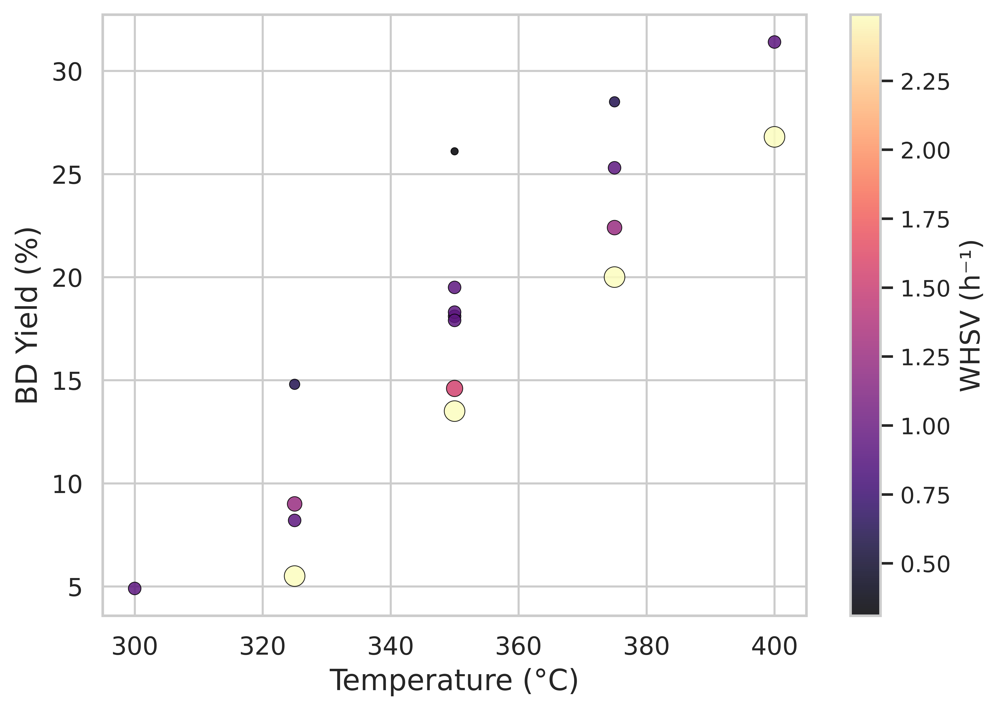

In [ ]:
# Load experimental data
df = pd.DataFrame(experimental_data)

# === Temperature vs BD Yield (WHSV as color & size) ===
plt.figure(figsize=(7, 5), dpi=800)

scatter = plt.scatter(
    df["T (°C)"],
    df["ηBD (%)"],
    c=df["WHSV (h^-1)"],
    s=df["WHSV (h^-1)"] * 40,   # size scaled for visibility
    cmap="magma",
    edgecolor="black",
    linewidth=0.4,
    alpha=0.85
)

# Labels and formatting for academic publishing
plt.xlabel("Temperature (°C)", fontsize=14)
plt.ylabel("BD Yield (%)", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

cbar = plt.colorbar(scatter)
cbar.set_label("WHSV (h⁻¹)", fontsize=13)
cbar.ax.tick_params(labelsize=11)

plt.tight_layout()
plt.savefig("Temperature_vs_BD_Yield_800dpi.png", dpi=800)
plt.show()


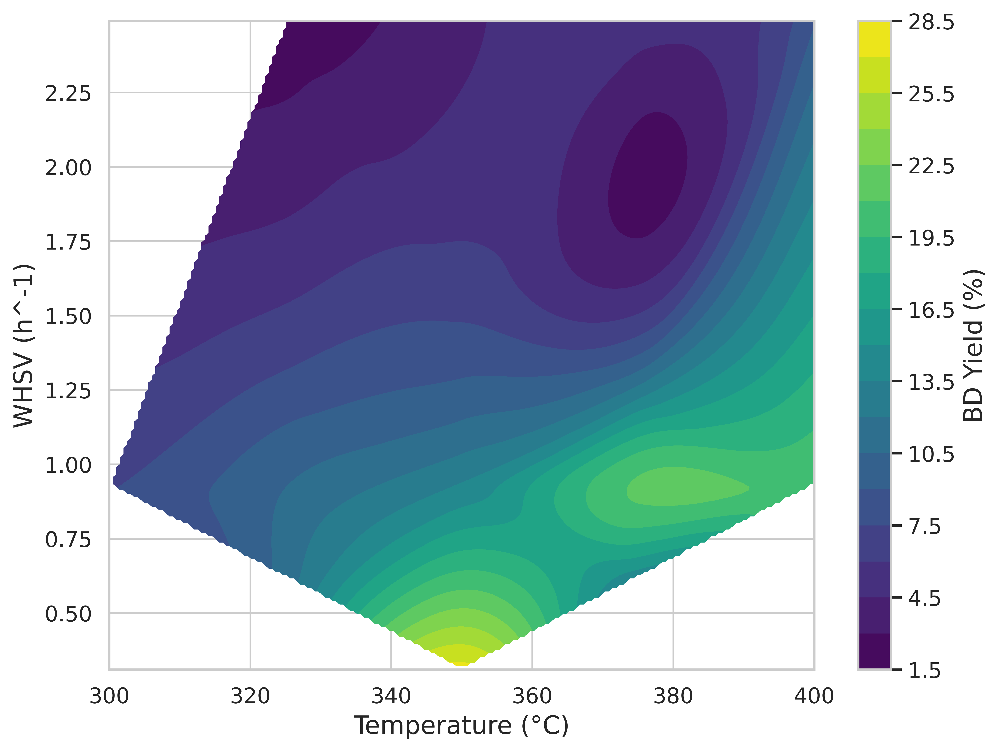

In [ ]:
# Contour plot (publication-quality)

# Prepare data for contour plot
T = df['T (°C)']
WHSV = df['WHSV (h^-1)']
yield_data = df['X (%)'] * df['Si_BD (%)'] / 100   # BD yield = X * SBD / 100

# Create grid points
grid_T = np.linspace(T.min(), T.max(), 200)        # higher resolution grid
grid_WHSV = np.linspace(WHSV.min(), WHSV.max(), 200)
grid_T_mesh, grid_WHSV_mesh = np.meshgrid(grid_T, grid_WHSV)

# Interpolate yield data onto the grid
grid_yield = griddata((T, WHSV), yield_data, (grid_T_mesh, grid_WHSV_mesh), method='cubic')

# Plotting (800 DPI, article-quality sizing)
plt.figure(figsize=(8, 6), dpi=800)

# Font settings typical for journals
plt.rcParams.update({
    'font.size': 12,
    'axes.labelsize': 14,
    'axes.titlesize': 16,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12
})

contour = plt.contourf(grid_T_mesh , grid_WHSV_mesh , grid_yield , levels=20 , cmap='viridis')
plt.colorbar(contour, label='BD Yield (%)')
plt.xlabel('Temperature (°C)')
plt.ylabel('WHSV (h^-1)')
plt.tight_layout()
plt.show()

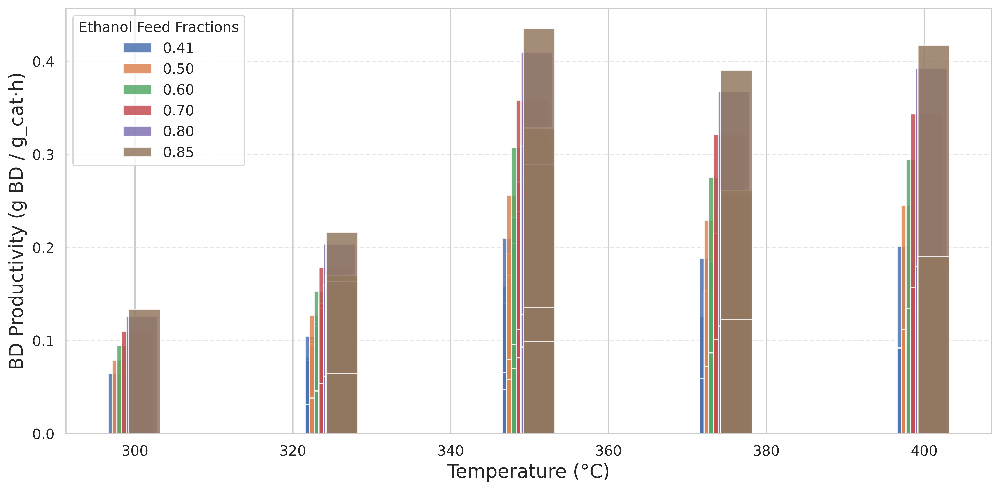

In [ ]:
# Constants for calculations
molar_mass_BD = 54.09   # g/mol
molar_mass_EtOH = 46.07 # g/mol
ethanol_feed_fractions = [0.41, 0.50, 0.60, 0.70, 0.80, 0.85]

# Function to calculate butadiene productivity
def calculate_butadiene_productivity(N_EtOH_0, X_EtOH, ethanol_feed_fraction):
    m_BD = N_EtOH_0 * X_EtOH * ethanol_feed_fraction * molar_mass_BD / molar_mass_EtOH
    return m_BD

# Calculate productivity for each ethanol feed fraction
productivity_results = []
for ethanol_feed_fraction in ethanol_feed_fractions:
    for index, row in df.iterrows():
        N_EtOH_0 = 1  # Placeholder value; modify as needed
        X_EtOH = row['X (%)'] / 100
        productivity = calculate_butadiene_productivity(N_EtOH_0, X_EtOH, ethanol_feed_fraction)

        productivity_results.append({
            'T (°C)': row['T (°C)'],
            'Ethanol Feed Fraction': ethanol_feed_fraction,
            'Butadiene Productivity': productivity
        })

# Create DataFrame
productivity_df = pd.DataFrame(productivity_results)

# === High-resolution Plot Configuration ===
plt.figure(figsize=(12, 6), dpi=800)

plt.rcParams.update({
    'font.size': 14,
    'axes.labelsize': 16,
    'axes.titlesize': 18,
    'legend.fontsize': 12,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12
})

# Plot histogram-like grouped bars
bar_width = 4
offset_scale = 6

for ethanol_feed_fraction in ethanol_feed_fractions:
    subset = productivity_df[productivity_df['Ethanol Feed Fraction'] == ethanol_feed_fraction]

    # Offset positions to avoid overlap
    offsets = (ethanol_feed_fraction - 0.65) * offset_scale

    plt.bar(
        subset['T (°C)'] + offsets,
        subset['Butadiene Productivity'],
        width=bar_width,
        label=f'{ethanol_feed_fraction:.2f}',
        alpha=0.85
    )

# Labels and formatting
plt.xlabel('Temperature (°C)')
plt.ylabel('BD Productivity (g BD / g_cat·h)')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.legend(title='Ethanol Feed Fractions', frameon=True)

# Export-quality spacing
plt.tight_layout()
plt.show()


In [ ]:
# === High-resolution (800 DPI) 3D Surface Plot ===

# Required imports
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401

# === High-resolution (800 DPI) 3D Surface Plot ===

plt.rcParams.update({
    'font.size': 16,
    'axes.labelsize': 18,
    'axes.titlesize': 20,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'legend.fontsize': 14
})

# Extract data as NumPy arrays
temps = df['T (°C)'].values
whsvs = df['WHSV (h^-1)'].values
yields = (df['X (%)'] * df['Si_BD (%)'] / 100).values  # BD yield calculation

fig = plt.figure(figsize=(14, 10), dpi=800)
ax = fig.add_subplot(111, projection='3d')

# Create interpolation grid
temp_lin = np.linspace(temps.min(), temps.max(), 80)
whsv_lin = np.linspace(whsvs.min(), whsvs.max(), 80)
temp_grid, whsv_grid = np.meshgrid(temp_lin, whsv_lin)

# Interpolate yield data for smooth surface
yield_grid = griddata(
    (temps, whsvs),
    yields,
    (temp_grid, whsv_grid),
    method='cubic'
)

# Mask NaNs that arise from cubic interpolation outside convex hull
yield_grid = np.ma.masked_invalid(yield_grid)

# Surface plot
surf = ax.plot_surface(
    temp_grid,
    whsv_grid,
    yield_grid,
    cmap='viridis',
    linewidth=0,
    edgecolor='none',
    antialiased=True,
    alpha=0.92
)

# Labels
ax.set_xlabel('Temperature (°C)', labelpad=12)
ax.set_ylabel('WHSV (h$^{-1}$)', labelpad=12)
ax.set_zlabel('BD Yield (%)', labelpad=12)

# Colorbar
cbar = fig.colorbar(
    surf,
    ax=ax,
    shrink=0.55,
    aspect=14,
)
cbar.set_label('BD Yield (%)', fontsize=16)

# Improve visual style
ax.view_init(elev=28, azim=135)
ax.grid(False)

plt.tight_layout()
plt.show()




Random Forest R² score: -2.84


/tmp/ipython-input-947834979.py:47: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




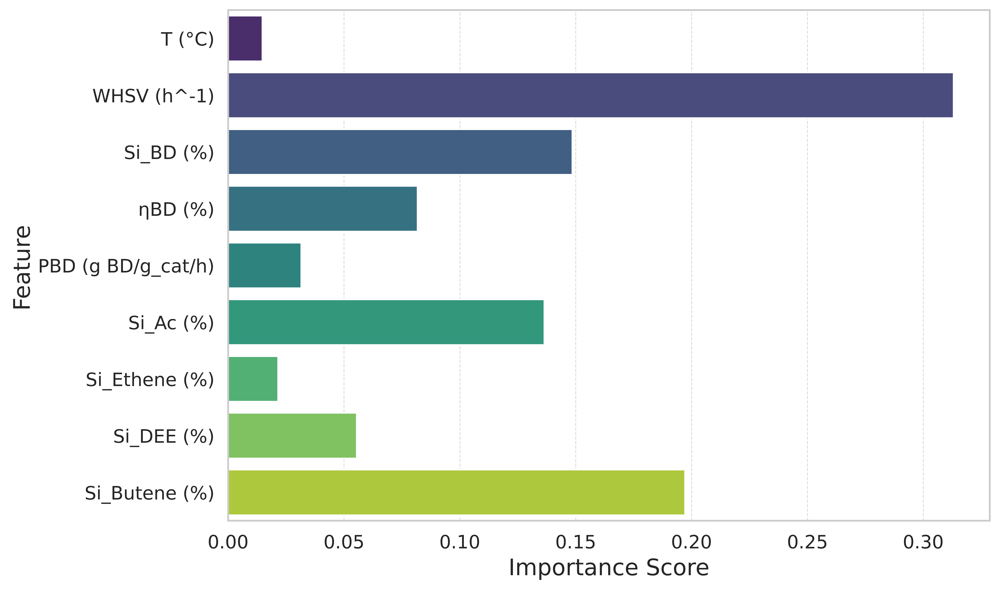

In [ ]:
# === High-Resolution Random Forest Regression Analysis (800 DPI) ===

# Global plotting style for academic figures
plt.rcParams.update({
    "figure.dpi": 800,
    "savefig.dpi": 800,
    "font.size": 14,
    "axes.labelsize": 16,
    "axes.titlesize": 18,
    "xtick.labelsize": 13,
    "ytick.labelsize": 13,
    "legend.fontsize": 13
})

# ------------------------------------------------------------
# Prepare data for Random Forest Regression
# ------------------------------------------------------------
X = df[['T (°C)', 'WHSV (h^-1)', 'Si_BD (%)',
        'ηBD (%)', 'PBD (g BD/g_cat/h)',
        'Si_Ac (%)', 'Si_Ethene (%)',
        'Si_DEE (%)', 'Si_Butene (%)']]

y = df['X (%)']

# Split dataset
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Fit Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predictions and performance
y_pred_rf = rf_model.predict(X_test)
rf_r_squared = rf_model.score(X_test, y_test)
print(f"Random Forest R² score: {rf_r_squared:.2f}")

# ------------------------------------------------------------
# High-resolution Feature Importance Plot
# ------------------------------------------------------------
feature_importances = rf_model.feature_importances_
features = X.columns

fig, ax = plt.subplots(figsize=(10, 6), dpi=800)

sns.barplot(
    x=feature_importances,
    y=features,
    palette="viridis",
    ax=ax
)

ax.set_xlabel("Importance Score")
ax.set_ylabel("Feature")

ax.grid(axis="x", linestyle="--", linewidth=0.6, alpha=0.7)

plt.tight_layout()
plt.savefig("feature_importance_RF.png", dpi=800, bbox_inches="tight")
plt.show()

fig.show()
